In [223]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge,RidgeCV,Lasso,LassoCV,ElasticNet,ElasticNetCV,LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score, confusion_matrix,roc_auc_score,roc_curve,precision_score,f1_score
from sklearn.metrics import cohen_kappa_score
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
import seaborn as sns
import pickle
import statsmodels.api as sm
import seaborn as sns
import scipy.stats as st
import matplotlib.pyplot as plt
#sns.set(style = 'whitegrid')
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import classification_report

from sklearn.feature_selection import RFE
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from sklearn.tree import DecisionTreeClassifier,export_graphviz
from sklearn.metrics import plot_confusion_matrix,plot_roc_curve,roc_auc_score,roc_curve

from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,StackingClassifier

from xgboost import XGBClassifier

In [77]:
df = pd.read_csv(r'D:\My Downloads\mu_sigma\mu_sigma\Problem statement 1_dataset\adult.csv')

In [78]:
df.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,country,salary
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


# Null Value check

In [79]:
df.isna().sum()

age               0
workclass         0
fnlwgt            0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
sex               0
capital-gain      0
capital-loss      0
hours-per-week    0
country           0
salary            0
dtype: int64

# Dataset info

In [80]:
df.columns


Index(['age', 'workclass', 'fnlwgt', 'education', 'education-num',
       'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'capital-gain', 'capital-loss', 'hours-per-week', 'country', 'salary'],
      dtype='object')

In [81]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education-num   32561 non-null  int64 
 5   marital-status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital-gain    32561 non-null  int64 
 11  capital-loss    32561 non-null  int64 
 12  hours-per-week  32561 non-null  int64 
 13  country         32561 non-null  object
 14  salary          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


# Dataset Profile Report

In [82]:
pf = df.profile_report()

In [83]:
pf

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [84]:
df.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education-num',
       'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'capital-gain', 'capital-loss', 'hours-per-week', 'country', 'salary'],
      dtype='object')

In [98]:
df.describe()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,salary
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456,0.240810
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429,0.427581
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000,0.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000,0.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000,0.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000,0.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000,1.000000


In [11]:
df


,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,country,salary
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [85]:
 df.salary[0]

' <=50K'

In [86]:
sal_val = []
for i in range(0,len(df)):
    if i in df[(df['salary']  == ' <=50K' )].index:
        sal_val.append(0)
    else:
        sal_val.append(1) 
df['salary'] = sal_val

In [87]:
 df

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,country,salary
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,0
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,0
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,1
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,0
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,0


In [88]:
pf = df.profile_report()

In [89]:
pf

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

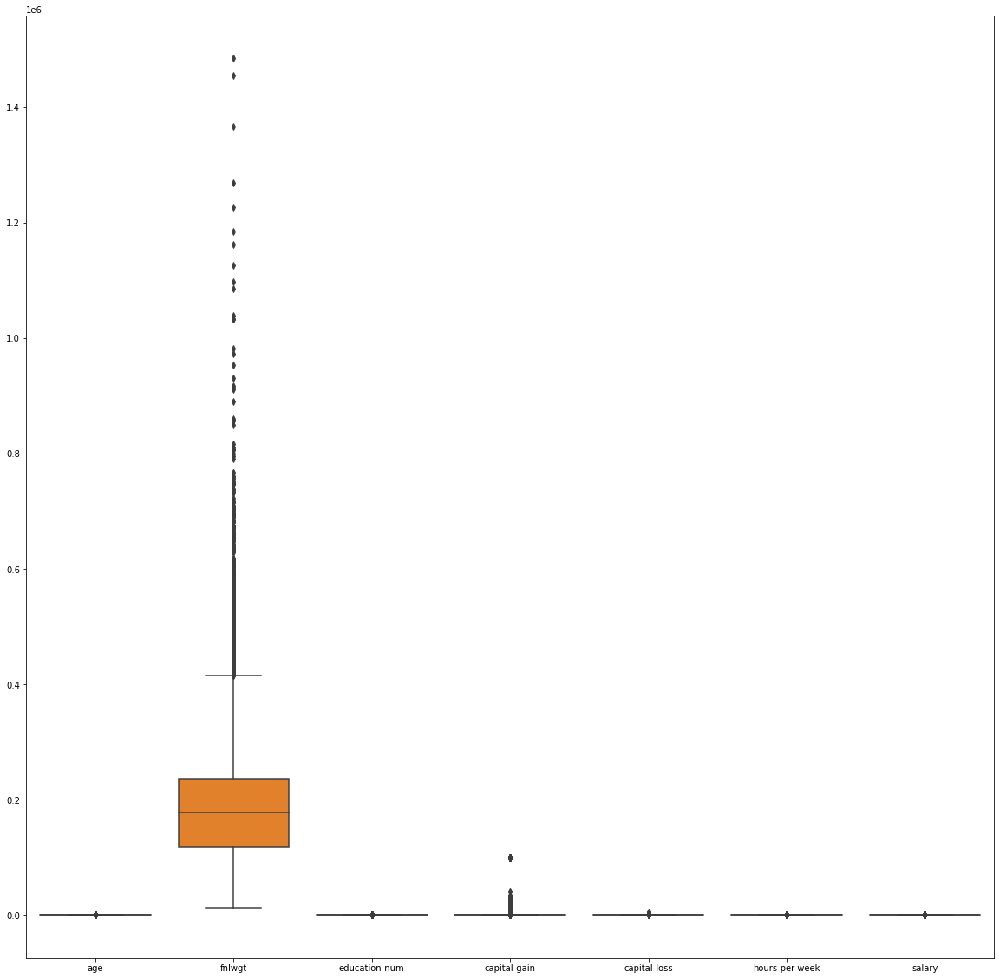

In [99]:
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df , ax = ax)

# One hot encoding for Categorical variables

In [90]:
cate_cols = [i for i in df.columns if df[i].dtype == 'O']

In [92]:
cate_cols

['workclass',
 'education',
 'marital-status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'country']

In [93]:
df1 = pd.get_dummies(df,columns=cate_cols)

In [94]:
df1

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,salary,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,...,country_ Portugal,country_ Puerto-Rico,country_ Scotland,country_ South,country_ Taiwan,country_ Thailand,country_ Trinadad&Tobago,country_ United-States,country_ Vietnam,country_ Yugoslavia
0,39,77516,13,2174,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,50,83311,13,0,0,13,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,38,215646,9,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,53,234721,7,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,28,338409,13,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,257302,12,0,0,38,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
32557,40,154374,9,0,0,40,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
32558,58,151910,9,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
32559,22,201490,9,0,0,20,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [95]:
pf1 = df1.profile_report()

In [96]:
pf1

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [97]:
df1


,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,salary,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,...,country_ Portugal,country_ Puerto-Rico,country_ Scotland,country_ South,country_ Taiwan,country_ Thailand,country_ Trinadad&Tobago,country_ United-States,country_ Vietnam,country_ Yugoslavia
0,39,77516,13,2174,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,50,83311,13,0,0,13,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,38,215646,9,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,53,234721,7,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,28,338409,13,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,257302,12,0,0,38,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
32557,40,154374,9,0,0,40,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
32558,58,151910,9,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
32559,22,201490,9,0,0,20,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [24]:
df1.describe()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,...,country_ Scotland,country_ South,country_ Taiwan,country_ Thailand,country_ Trinadad&Tobago,country_ United-States,country_ Vietnam,country_ Yugoslavia,salary_ <=50K,salary_ >50K
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000,32561.000000,32561.000000,32561.000000,32561.000000,...,32561.000000,32561.000000,32561.000000,32561.000000,32561.000000,32561.000000,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456,0.056386,0.029483,0.064279,0.000215,...,0.000369,0.002457,0.001566,0.000553,0.000584,0.895857,0.002058,0.000491,0.759190,0.240810
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429,0.230670,0.169159,0.245254,0.014661,...,0.019194,0.049507,0.039546,0.023506,0.024149,0.305451,0.045316,0.022162,0.427581,0.427581
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# Train Test Split

In [100]:
df1.columns

Index(['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss',
       'hours-per-week', 'salary', 'workclass_ ?', 'workclass_ Federal-gov',
       'workclass_ Local-gov',
       ...
       'country_ Portugal', 'country_ Puerto-Rico', 'country_ Scotland',
       'country_ South', 'country_ Taiwan', 'country_ Thailand',
       'country_ Trinadad&Tobago', 'country_ United-States',
       'country_ Vietnam', 'country_ Yugoslavia'],
      dtype='object', length=109)

In [102]:
x = df1.drop(columns =['salary'],axis=1)


In [104]:
x

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,...,country_ Portugal,country_ Puerto-Rico,country_ Scotland,country_ South,country_ Taiwan,country_ Thailand,country_ Trinadad&Tobago,country_ United-States,country_ Vietnam,country_ Yugoslavia
0,39,77516,13,2174,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,50,83311,13,0,0,13,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,38,215646,9,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,53,234721,7,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,28,338409,13,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,257302,12,0,0,38,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
32557,40,154374,9,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
32558,58,151910,9,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
32559,22,201490,9,0,0,20,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [105]:
x1 = df1.drop(columns=['salary' , 'fnlwgt'],axis=1)

In [106]:
x1

,age,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,...,country_ Portugal,country_ Puerto-Rico,country_ Scotland,country_ South,country_ Taiwan,country_ Thailand,country_ Trinadad&Tobago,country_ United-States,country_ Vietnam,country_ Yugoslavia
0,39,13,2174,0,40,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,50,13,0,0,13,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,38,9,0,0,40,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
3,53,7,0,0,40,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
4,28,13,0,0,40,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,12,0,0,38,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
32557,40,9,0,0,40,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
32558,58,9,0,0,40,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
32559,22,9,0,0,20,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0


In [107]:
y = df.salary


In [108]:
y

0        0
1        0
2        0
3        0
4        0
        ..
32556    0
32557    1
32558    0
32559    0
32560    1
Name: salary, Length: 32561, dtype: int64

In [109]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=30)

In [110]:
x_train

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,...,country_ Portugal,country_ Puerto-Rico,country_ Scotland,country_ South,country_ Taiwan,country_ Thailand,country_ Trinadad&Tobago,country_ United-States,country_ Vietnam,country_ Yugoslavia
16917,36,182074,9,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
31078,18,141626,10,2176,0,20,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
14943,31,214235,9,0,0,65,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2658,49,277434,9,0,0,50,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
31540,61,69285,9,0,0,37,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
500,23,324960,9,0,0,40,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
12077,61,210464,9,0,0,35,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
15277,31,207685,9,0,0,34,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4517,47,197836,9,0,0,45,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [111]:
x_test

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,...,country_ Portugal,country_ Puerto-Rico,country_ Scotland,country_ South,country_ Taiwan,country_ Thailand,country_ Trinadad&Tobago,country_ United-States,country_ Vietnam,country_ Yugoslavia
32129,48,350440,10,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7202,63,35021,13,0,1977,32,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4900,33,196266,9,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
7753,33,221324,9,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1208,22,42004,10,0,0,30,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9252,41,289886,3,0,1579,40,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15936,27,289484,10,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5302,21,180339,10,0,0,25,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
14976,37,167777,9,0,0,52,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [112]:
 y_train

16917    0
31078    0
14943    0
2658     0
31540    0
        ..
500      0
12077    0
15277    0
4517     0
5925     1
Name: salary, Length: 22792, dtype: int64

# Standerdisation

In [142]:
 scaler = StandardScaler()

In [143]:
X_scaled = scaler.fit_transform(x)

In [144]:
X_scaled

array([[ 0.03067056, -1.06361075,  1.13473876, ...,  0.34095391,
        -0.04540836, -0.02217266],
       [ 0.83710898, -1.008707  ,  1.13473876, ...,  0.34095391,
        -0.04540836, -0.02217266],
       [-0.04264203,  0.2450785 , -0.42005962, ...,  0.34095391,
        -0.04540836, -0.02217266],
       ...,
       [ 1.42360965, -0.35877741, -0.42005962, ...,  0.34095391,
        -0.04540836, -0.02217266],
       [-1.21564337,  0.11095988, -0.42005962, ...,  0.34095391,
        -0.04540836, -0.02217266],
       [ 0.98373415,  0.92989258, -0.42005962, ...,  0.34095391,
        -0.04540836, -0.02217266]])

In [119]:
 # lets find the vif score

def vif_score(x):
    scaler = StandardScaler()
    arr = scaler.fit_transform(x)
    return pd.DataFrame([[x.columns[i], variance_inflation_factor(arr, i)] for i in range(arr.shape[1])], columns=["FEATURE", "VIF-SCORE"])


In [120]:
vif_score(x)

,FEATURE,VIF-SCORE
0,age,1.743275
1,fnlwgt,1.061181
2,education-num,inf
3,capital-gain,1.060854
4,capital-loss,1.024377
...,...,...
103,country_ Thailand,inf
104,country_ Trinadad&Tobago,inf
105,country_ United-States,inf
106,country_ Vietnam,inf


In [ ]:
# we  see  multicolieriaty (vif is  > 10). so  need to drop some of x column

# Logistic Regression

In [145]:
x_train, x_test , y_train , y_test = train_test_split(X_scaled, y , test_size = 0.3 , random_state = 30)

In [146]:
logr = LogisticRegression()

In [147]:
logr.fit(x_train , y_train)

LogisticRegression()

In [154]:
x_test

array([[ 0.69048381,  1.52216139, -0.03136003, ..., -2.93294771,
        -0.04540836, -0.02217266],
       [ 1.79017257, -1.46622241,  1.13473876, ..., -2.93294771,
        -0.04540836, -0.02217266],
       [-0.40920495,  0.06146598, -0.42005962, ...,  0.34095391,
        -0.04540836, -0.02217266],
       ...,
       [-1.28895595, -0.08943168, -0.03136003, ...,  0.34095391,
        -0.04540836, -0.02217266],
       [-0.11595461, -0.20844821, -0.42005962, ...,  0.34095391,
        -0.04540836, -0.02217266],
       [ 1.71685999,  0.13554577, -0.03136003, ...,  0.34095391,
        -0.04540836, -0.02217266]])

In [156]:
y_pred = logr.predict(x_test)

In [151]:
y_test

32129    1
7202     1
4900     1
7753     0
1208     0
        ..
9252     0
15936    0
5302     0
14976    0
9476     0
Name: salary, Length: 9769, dtype: int64

In [157]:
y_pred

array([0, 1, 0, ..., 0, 0, 0], dtype=int64)

In [159]:
len(y_pred)

9769

In [162]:
d = pd.DataFrame(y_pred)

In [163]:
d.head()

,0
0,0
1,1
2,0
3,0
4,0


In [164]:
confusion_matrix(y_test, y_pred)

array([[6957,  507],
       [ 922, 1383]], dtype=int64)

In [165]:
# find the accuracy, precision, recall etc

def model_eval(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_test,y_pred).ravel()
    accuracy = (tp+tn)/(tp+tn+fp+fn)
    precision = tp/(tp+fp)
    recall = tp/(tp+fn)
    specificity = tn/(fp+tn)
    result = {"Accuaracy " :accuracy,
              "Precision " :precision,
            " Recall" : recall,
              " specificity" : specificity}
    return result

model_eval(y_test,y_pred )

{'Accuaracy ': 0.8537209540382844,
 'Precision ': 0.7317460317460317,
 ' Recall': 0.6,
 ' specificity': 0.9320739549839229}

In [166]:
# what is the area under the curve

auc = roc_auc_score(y_test,y_pred )

In [167]:
roc_curve(y_test,y_pred)

(array([0.        , 0.06792605, 1.        ]),
 array([0. , 0.6, 1. ]),
 array([2, 1, 0], dtype=int64))

In [168]:
fpr, tpr , thresholds  = roc_curve(y_test,y_pred)

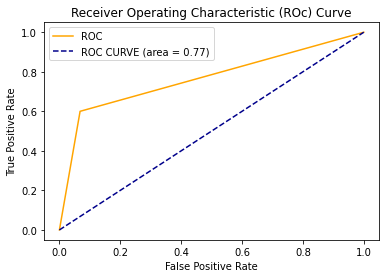

In [169]:
plt.plot(fpr, tpr, color = 'orange' , label = 'ROC')
plt.plot([0,1],[0,1] , color ='darkblue' , linestyle = '--' , label="ROC CURVE (area = %0.2f)" % auc)
plt.xlabel ('False Positive Rate')
plt.ylabel ('True Positive Rate')
plt.title("Receiver Operating Characteristic (ROc) Curve")
plt.legend()
plt.show()

 # lets use a different solver while building the model

In [171]:
logr_liblinear = LogisticRegression(verbose=1 , solver = 'liblinear')
logr_liblinear.fit(x_train , y_train)
logr_liblinear.fit(x_train , y_train)

[LibLinear][LibLinear]

LogisticRegression(solver='liblinear', verbose=1)

In [172]:
y_pred_liblinear = logr_liblinear.predict(x_test)
y_pred_liblinear 

array([0, 1, 0, ..., 0, 0, 0], dtype=int64)

In [173]:
y_pred_logr_default = logr.predict(x_test)
y_pred_logr_default

array([0, 1, 0, ..., 0, 0, 0], dtype=int64)

In [174]:
confusion_matrix(y_test, y_pred_liblinear )

array([[6957,  507],
       [ 920, 1385]], dtype=int64)

In [175]:
confusion_matrix(y_test, y_pred_logr_default )

array([[6957,  507],
       [ 922, 1383]], dtype=int64)

In [177]:

def model_eval(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_test,y_pred).ravel()
    accuracy = (tp+tn)/(tp+tn+fp+fn)
    precision = tp/(tp+fp)
    recall = tp/(tp+fn)
    specificity = tn/(fp+tn)
    F1_score = 2*(recall*precision)/(recall + precision)
    result = {"Accuaracy " :accuracy,
              "Precision " :precision,
              "Recall" : recall,
              "specificity" : specificity,
              "F1 score" : F1_score
             }
    return result

model_eval(y_test,y_pred_liblinear )

{'Accuaracy ': 0.8539256832838571,
 'Precision ': 0.7320295983086681,
 'Recall': 0.6008676789587852,
 'specificity': 0.9320739549839229,
 'F1 score': 0.6599952346914462}

In [178]:
# what is the area under the curve

auc = roc_auc_score(y_test,y_pred_liblinear )

In [179]:
auc

0.7664708169713541

In [180]:
fpr, tpr , thresholds  = roc_curve(y_test,y_pred_liblinear)

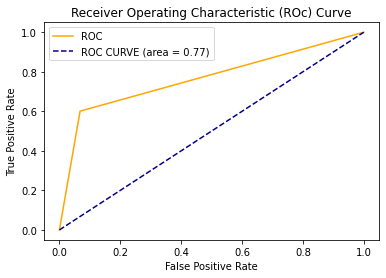

In [181]:
plt.plot(fpr, tpr, color = 'orange' , label = 'ROC')
plt.plot([0,1],[0,1] , color ='darkblue' , linestyle = '--' , label="ROC CURVE (area = %0.2f)" % auc)
plt.xlabel ('False Positive Rate')
plt.ylabel ('True Positive Rate')
plt.title("Receiver Operating Characteristic (ROc) Curve")
plt.legend()
plt.show()

# Decision Tree

In [183]:
dt_model = DecisionTreeClassifier()
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [185]:
from sklearn import tree
%matplotlib inline

[Text(0.4929680445508846, 0.9897959183673469, 'X[33] <= 0.08\ngini = 0.368\nsamples = 22792\nvalue = [17256, 5536]'),
 Text(0.21122364540595587, 0.9693877551020408, 'X[3] <= 0.812\ngini = 0.127\nsamples = 12260\nvalue = [11422, 838]'),
 Text(0.1743094272331947, 0.9489795918367347, 'X[2] <= 1.329\ngini = 0.098\nsamples = 12035\nvalue = [11415, 620]'),
 Text(0.12512663374540733, 0.9285714285714286, 'X[5] <= 0.329\ngini = 0.075\nsamples = 11378\nvalue = [10933, 445]'),
 Text(0.08844027481005111, 0.9081632653061225, 'X[4] <= 5.289\ngini = 0.042\nsamples = 9333\nvalue = [9131, 202]'),
 Text(0.0595638828152846, 0.8877551020408163, 'X[0] <= -0.299\ngini = 0.039\nsamples = 9299\nvalue = [9112, 187]'),
 Text(0.022449250254888472, 0.8673469387755102, 'X[32] <= 18.793\ngini = 0.013\nsamples = 5719\nvalue = [5681, 38]'),
 Text(0.012823169569217762, 0.8469387755102041, 'X[1] <= -1.572\ngini = 0.012\nsamples = 5711\nvalue = [5677, 34]'),
 Text(0.00501322104425527, 0.826530612244898, 'X[1] <= -1.577\

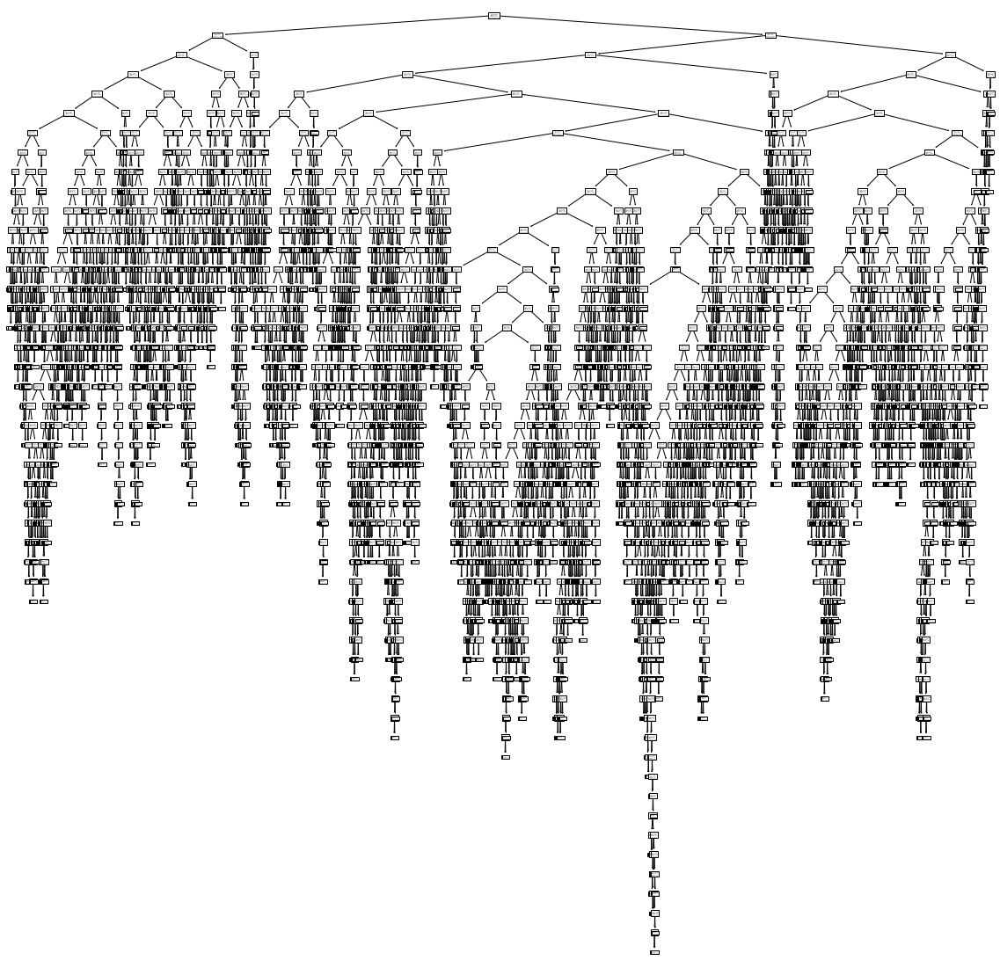

In [186]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model)

In [188]:
dt_model.predict(x_test)

array([0, 1, 0, ..., 0, 1, 0], dtype=int64)

In [189]:
dt_model.score(x_test, y_test)

0.8153342204933974

# Hyperparameter Tuning

In [197]:
dt = DecisionTreeClassifier()

In [199]:
from sklearn.model_selection import GridSearchCV

In [204]:
params = {'max_depth':[3,4,5],
    'min_samples_split':[2,3,4],
    'min_samples_leaf':[1,2,3],
    'max_leaf_nodes':[13,14,15],
     'criterion' : ['gini' , 'entropy']   }

dt_grid = GridSearchCV(dt,param_grid=params,scoring='accuracy',n_jobs=-1)
dt_grid.fit(x_train,y_train)

GridSearchCV(estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 4, 5], 'max_leaf_nodes': [13, 14, 15],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 3, 4]},
             scoring='accuracy')

In [205]:
dt_grid.best_params_

{'criterion': 'gini',
 'max_depth': 5,
 'max_leaf_nodes': 15,
 'min_samples_leaf': 1,
 'min_samples_split': 2}

In [206]:
tuned_mod = DecisionTreeClassifier(criterion= 'gini', max_depth =  5, max_leaf_nodes =  15, 
                                   min_samples_leaf =  1, min_samples_split =  2)

In [208]:
tuned_mod.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=5, max_leaf_nodes=15)

In [210]:
ypred_tuned = tuned_mod.predict(x_test)

In [214]:
print('Decision Tree:')
print(classification_report(y_test,ypred_tuned))

print('ROC AUC Score:',round(roc_auc_score(y_test,tuned_mod.predict_proba(x_test)[:,1]),2))

Decision Tree:
              precision    recall  f1-score   support

           0       0.86      0.96      0.91      7464
           1       0.79      0.50      0.61      2305

    accuracy                           0.85      9769
   macro avg       0.82      0.73      0.76      9769
weighted avg       0.84      0.85      0.84      9769

ROC AUC Score: 0.89


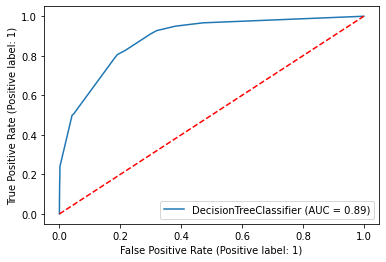

In [215]:
plot_roc_curve(estimator=tuned_mod,X= x_test,y= y_test)
plt.plot([0,1],[0,1],'r--')
plt.show()

In [217]:
cp = classification_report(y_test,ypred_tuned).split()
metrics_df3 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(y_test,ypred_tuned),3),round(roc_auc_score(y_test,ypred_tuned),3)],
                          index=['PS1_precision','PS1_recall','PS1_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Decision_Tree']).T



In [218]:
metrics_df2 = pd.concat([metrics_df3],axis=0)
metrics_df2

,PS1_precision,PS1_recall,PS1_f1score,Accuracy,Roc_Auc_Score
Decision_Tree,0.86,0.96,0.91,0.85,0.729


# Random Forest (Bagging)

In [219]:
rf = RandomForestClassifier(n_estimators=250)

In [220]:
params = {'max_depth':np.arange(30,50,5)}

In [221]:
rf_grid = GridSearchCV(estimator=rf,param_grid=params,cv=5,n_jobs=-1)
rf_grid.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(n_estimators=250),
             n_jobs=-1, param_grid={'max_depth': array([30, 35, 40, 45])})

In [222]:
rf_grid.best_params_

{'max_depth': 30}

In [225]:
rf_tuned = RandomForestClassifier(n_estimators=250,max_depth=30).fit(x_train,y_train)

In [227]:
print('Random Forest:')
rf_ypred = rf_tuned.predict(x_test)
print(classification_report(y_test,rf_ypred))


Random Forest:
              precision    recall  f1-score   support

           0       0.89      0.94      0.91      7464
           1       0.76      0.61      0.68      2305

    accuracy                           0.86      9769
   macro avg       0.82      0.78      0.80      9769
weighted avg       0.86      0.86      0.86      9769



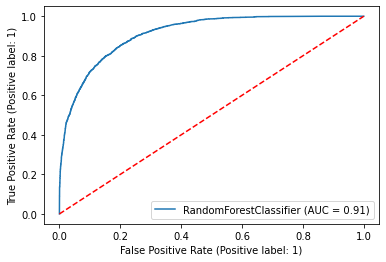

In [228]:
plot_roc_curve(estimator=rf_tuned, X = x_test, y = y_test)
plt.plot([0,1],[0,1],'r--')
plt.show()

In [229]:
cp = classification_report(y_test,rf_ypred).split()
metrics_df4 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(y_test,rf_ypred),3),round(roc_auc_score(y_test,rf_ypred),3)],
                          index=['PS1_precision','PS1_recall','PS1_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Random_Forest']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df4],axis=0)
metrics_df2



,PS1_precision,PS1_recall,PS1_f1score,Accuracy,Roc_Auc_Score
Decision_Tree,0.86,0.96,0.91,0.85,0.729
Random_Forest,0.89,0.94,0.91,0.863,0.776


# XG BOOST

In [230]:
xgb = XGBClassifier(gamma=1)

In [231]:
xgb.fit(x_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=1, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [232]:
ypred =xgb.predict(x_test)
ypred_prob = xgb.predict_proba(x_test)[:,1]

In [234]:
print('XG Boost')
print(classification_report(y_test,ypred))


XG Boost
              precision    recall  f1-score   support

           0       0.90      0.94      0.92      7464
           1       0.77      0.65      0.71      2305

    accuracy                           0.87      9769
   macro avg       0.83      0.80      0.81      9769
weighted avg       0.87      0.87      0.87      9769



In [236]:
fpr,tpr,th = roc_curve(y_test,ypred_prob)

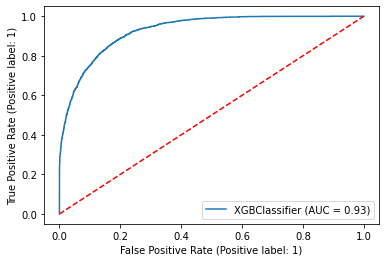

In [237]:
plot_roc_curve(estimator=xgb,X=x_test,y=y_test)
plt.plot([0,1],[0,1],'r--')
plt.show()

In [238]:
cp = classification_report(y_test,ypred).split()
metrics_df6 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(y_test,ypred),3),round(roc_auc_score(y_test,ypred),3)],
                          index=['PS1_precision','PS1_recall','PS1_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['XGBoost']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df6],axis=0)
metrics_df2

,PS1_precision,PS1_recall,PS1_f1score,Accuracy,Roc_Auc_Score
Decision_Tree,0.86,0.96,0.91,0.85,0.729
Random_Forest,0.89,0.94,0.91,0.863,0.776
XGBoost,0.90,0.94,0.92,0.872,0.796
